In [1]:
import os
import logging
from pathlib import Path
import datetime
import xml.etree.ElementTree as ET

from tqdm import tqdm
import numpy as np
import math
import pandas as pd
import random

import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
# Not needed
# from torchvision.transforms import ToTensor 
# from torchvision.transforms.v2 import (Compose, ToImage, ToDtype, 
#                                        Normalize, RandomPhotometricDistort)

import albumentations as A
from albumentations.pytorch import ToTensorV2

import matplotlib.pyplot as plt
import matplotlib.patches as patches 

import torch.nn as nn 
from torch.nn.utils import parameters_to_vector
import torch.optim as optim

import torchmetrics

import cv2

In [2]:
#torch.cuda.empty_cache()

# Config

In [3]:
CLASSES = ["smoke", "fire"]
N_CLASSES = len(CLASSES)

IMG_DIM = {'W':224, 'H':224} # (W, H)
IMG_H = IMG_DIM['H']
IMG_W = IMG_DIM['W']

# Dataset

# DFire

In [4]:
class DFireDataset_EVAL(Dataset):
    '''
    Creates a Pytorch Dataset to train the Yolov1 Network.
    Encodes labels to match the format [xcell, ycell, w, h, confidence, class_0 (smoke), class_1 (fire)]
        - Final encoding format is: [xcell, ycell, w, h, conf=1, smoke?, fire?]

    Discard images when there are more than 1 object in the same cell
    
    Arguments:
        - img_h:            image height
        - img_w:            image width
        - img_dir:          path to images folder
        - label_dir:        path to labels folder
        - num_classes:      number of classes
        - transform:        transformation applied to input images -> Albumentations
        - target_transform: transformation applied to labels -> nothing by default

    Return:
        - img:              1 image of the dataset
        - target:           corresponding label encoded: [smoke, fire]
    '''

    def __init__(self, img_h, img_w, img_dir, label_dir, num_classes,
                 ds_len,
                 transform=None, target_transform=None):
        self.img_h = img_h
        self.img_w = img_w
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.num_classes = num_classes
        self.ds_len = ds_len
        self.transform = transform
        self.target_transform = target_transform

        self.labels_list = sorted(
            [
                os.path.join(self.label_dir, file_name)
                for file_name in os.listdir(self.label_dir)
                if file_name.endswith(".txt")
            ]
        )
    
        if ds_len is not None:
            random.seed(123)
            random.shuffle(self.labels_list)
            self.images_path, self.labels = self.__build_ds__(self.labels_list[:self.ds_len])
            self.num_samples = len(self.labels_list[:self.ds_len])
        else:
            self.images_path, self.labels = self.__build_ds__(self.labels_list)
            self.num_samples = len(self.labels_list)

    def __len__(self):
        return self.num_samples   

    def __build_ds__(self, labels_list):
        labels = []
        images = []
        wrong_imgs = 0
        empty = 0
        only_smoke = 0
        only_fire = 0
        smoke_fire = 0
                
        for label in labels_list:
            fname = Path(label).stem
            image_path = self.img_dir + fname + '.jpg'   
            #print(fname, image_path)
                                   
            if cv2.imread(image_path) is None:
                print(f'{image_path} cannot be read by cv2 -> removed')
                wrong_imgs += 1
            
            else:
                
                label_array = np.zeros((self.num_classes))
            
                with open(label) as f:
                    lines = f.readlines()
                       
                    for line in lines:
                        class_id, _, _, _, _ = line.strip().split()
                        class_id = int(class_id)
                        if np.array_equal(label_array, np.array([1, 1])):
                            break
                        else:
                            label_array[class_id] = 1.

                    if np.array_equal(label_array, np.array([1, 1])):
                        smoke_fire += 1
                    elif np.array_equal(label_array, np.array([0, 1])):
                        only_fire += 1
                    elif np.array_equal(label_array, np.array([1, 0])):
                        only_smoke += 1
                    elif np.array_equal(label_array, np.array([0, 0])):
                        empty += 1
                    else:
                        print("Wrong label in DFire dataset")
                        # logger.info("Wrong label in DFire dataset")
                        
                    labels.append(label_array)
                    images.append(image_path)
        
        print(f'DFire Removed wrong images: {wrong_imgs}')
        # logger.info(f'DFire Removed wrong images: {wrong_imgs}')
        print(f'DFire empty images: {empty}')
        # logger.info(f'DFire empty images: {empty}')
        print(f'DFire only smoke images: {only_smoke}')
        # logger.info(f'DFire only smoke images: {only_smoke}')
        print(f'DFire only fire images: {only_fire}')
        # logger.info(f'DFire only fire images: {only_fire}')
        print(f'DFire smoke and fire images: {smoke_fire}')
        # logger.info(f'DFire smoke and fire images: {smoke_fire}')

        labels_np = np.array(labels)
        labels_tensor = torch.tensor(labels_np, dtype=torch.float32)
        images_array = np.array(images)
        
        return images_array, labels_tensor

    def __getitem__(self, index):

        # Image processing
        img_file = self.images_path[index]
        img = cv2.imread(img_file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)   
        
        img_2_plot = img.copy()
        img_2_plot = cv2.resize(img, (self.img_w, self.img_h), interpolation = cv2.INTER_NEAREST)
        
        # Labels processing
        label = self.labels[index]
        
        # Data Augmentation
        if self.transform is not None:
            try:
                aug = self.transform(image=img)
                #img = aug['image'] / 255.0
                img = aug['image'] 
            except:
                #print(f'Error trying to augment image {img_file}')
                img = cv2.resize(img, (self.img_w, self.img_h), interpolation = cv2.INTER_NEAREST)
                img = (img / 255.0)
                img = torch.tensor(img, dtype=torch.float32)
                img = img.permute(2, 0, 1)
        
        return img, label, img_2_plot

### View Dataset

In [5]:
ds_dir = '../../datasets/ds2fire/dfire_yolo/'

train_dir = ds_dir + 'train/'
train_imgs = train_dir + 'images/'
train_labels = train_dir + 'labels/'

#val_dir = ds_dir + 'test/'

val_dir = ds_dir + 'test/'
val_imgs = val_dir + 'images/'
val_labels = val_dir + 'labels/'

print(f'Train dir: {os.listdir(train_dir)}')
print(f'val dir: {os.listdir(val_dir)}')

Train dir: ['labels', '.ipynb_checkpoints', 'images']
val dir: ['labels', '.ipynb_checkpoints', 'images']


# Model: SqueezeNet

In [6]:
class Fire(nn.Module):
    def __init__(self, inplanes: int, squeeze_planes: int, expand1x1_planes: int, expand3x3_planes: int) -> None:
        super().__init__()
        self.inplanes = inplanes
        self.squeeze = nn.Conv2d(inplanes, squeeze_planes, kernel_size=1)
        self.squeeze_activation = nn.ReLU()
        self.expand1x1 = nn.Conv2d(squeeze_planes, expand1x1_planes, kernel_size=1)
        self.expand1x1_activation = nn.ReLU()
        self.expand3x3 = nn.Conv2d(squeeze_planes, expand3x3_planes, kernel_size=3, padding=1)
        self.expand3x3_activation = nn.ReLU()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.squeeze_activation(self.squeeze(x))
        return torch.cat(
            [self.expand1x1_activation(self.expand1x1(x)), self.expand3x3_activation(self.expand3x3(x))], 1
        )


class SqueezeNet(nn.Module):
    def __init__(self, num_classes: int = 2, dropout: float = 0.5) -> None:
        super().__init__()
        self.num_classes = num_classes
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=2),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3, stride=2, ceil_mode=True),
            Fire(64, 16, 64, 64),
            Fire(128, 16, 64, 64),
            nn.MaxPool2d(kernel_size=3, stride=2, ceil_mode=True),
            Fire(128, 32, 128, 128),
            Fire(256, 32, 128, 128),
            nn.MaxPool2d(kernel_size=3, stride=2, ceil_mode=True),
            Fire(256, 48, 192, 192),
            Fire(384, 48, 192, 192),
            Fire(384, 64, 256, 256),
            Fire(512, 64, 256, 256),
            # Final convolution
        )

        # Final convolution is initialized differently from the rest
        smoke_final_conv = nn.Conv2d(512, 1, kernel_size=1)
        fire_final_conv = nn.Conv2d(512, 1, kernel_size=1)
        self.smoke = nn.Sequential(
            nn.Dropout(p=dropout),
            smoke_final_conv,
            nn.ReLU(), 
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(start_dim=1, end_dim=-1),
            nn.Linear(in_features=1, out_features=1)
        )
        self.fire = nn.Sequential(
            nn.Dropout(p=dropout),
            fire_final_conv,
            nn.ReLU(), 
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(start_dim=1, end_dim=-1),
            nn.Linear(in_features=1, out_features=1)
        )

        # for m in self.modules():
        #     if isinstance(m, nn.Conv2d):
        #         if m is smoke_final_conv:
        #             nn.init.normal_(m.weight, mean=0.0, std=0.01)
        #         elif m is fire_final_conv:
        #             nn.init.normal_(m.weight, mean=0.0, std=0.01)
        #         else:
        #             nn.init.kaiming_uniform_(m.weight)
        #         if m.bias is not None:
        #             nn.init.constant_(m.bias, 0)
        #     elif isinstance(m, nn.Linear):
        #         nn.init.normal_(m.weight, 0, 0.01)
        #         nn.init.constant_(m.bias, 0)
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_in',
                    nonlinearity='relu'
                )
                if m.bias is not None:
                        nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        smoke = self.smoke(x)
        fire = self.fire(x)
        x = torch.cat((smoke, fire), dim=-1)
        return x

# Evaluate Model

In [7]:
val_transform = A.Compose([
    A.Resize(IMG_H, IMG_W, p=1),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), p=1), 
    ToTensorV2(p=1),
    ]
)

val_dataset = DFireDataset_EVAL(img_h = IMG_H,
                                img_w = IMG_W,
                                img_dir = val_imgs,
                                label_dir = val_labels,
                                num_classes = N_CLASSES,
                                ds_len=512,
                                transform=val_transform)

# LOADER
BATCH_SIZE = 32
NUM_WORKERS = 1
PIN_MEMORY = True
plot_loader = DataLoader(dataset=val_dataset,
                         batch_size=BATCH_SIZE,
                         num_workers=NUM_WORKERS,
                         pin_memory=PIN_MEMORY,
                         shuffle=True,
                         drop_last=True)



DFire Removed wrong images: 0
DFire empty images: 241
DFire only smoke images: 141
DFire only fire images: 30
DFire smoke and fire images: 100


In [8]:
view_model = SqueezeNet(num_classes=N_CLASSES)
model_file = 'squeezeNet_train_more/' + 'SQUEEZE_classifier_5epoch.pt'

print(model_file)

checkpoint = torch.load(model_file, map_location=torch.device('cpu'))
view_model.load_state_dict(checkpoint['model_state_dict'])

view_model.eval() 

squeezeNet_train_more/SQUEEZE_classifier_5epoch.pt


SqueezeNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (3): Fire(
      (squeeze): Conv2d(64, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU()
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU()
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU()
    )
    (4): Fire(
      (squeeze): Conv2d(128, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU()
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU()
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU()
    )
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (6): Fire(
    

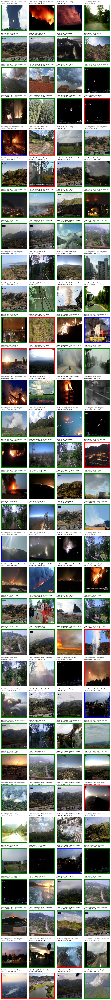

In [9]:
n_imgs_plot = BATCH_SIZE * 4
cols = 4
rows = int( n_imgs_plot / cols )

fig, ax = plt.subplots(rows, cols, figsize=(9, 80))

for batch_idx, (img, label, img_2_plot) in enumerate(plot_loader):
    for i in range(int(BATCH_SIZE/cols)):
        for j in range(cols):

            plot_idx = batch_idx*BATCH_SIZE + i*cols + j + 1
            sample_idx = i*cols + j
            ax_idx = batch_idx*(int(BATCH_SIZE/cols)) + i 
            # print(f'Plot idx: {plot_idx}')
            # print(f'Sample idx: {sample_idx}')
            # print(f'Ax idx: {ax_idx}')
            
            plt.subplot(rows, cols, plot_idx)
            plt.imshow(img_2_plot[sample_idx])

            label_txt = ""
            #print(f'Label: {label[i*cols + j]}')
            if label[sample_idx, 0] == 1 and label[sample_idx, 1] == 1:
                label_txt += "Smoke & Fire"
            elif label[sample_idx, 0] == 1 and label[sample_idx, 1] == 0:
                label_txt += "Only Smoke"
            elif label[sample_idx, 0] == 0 and label[sample_idx, 1] == 1:
                label_txt += "Only Fire"
            else:
                label_txt += "Empty"

            pred = torch.sigmoid( view_model(img[sample_idx].unsqueeze(dim=0)) )
            #print(f'Pred: {pred}')
            pred_txt = ""
            if pred[..., 0] > 0.5 and pred[..., 1] > 0.5:
                pred_txt += "Smoke & Fire"
            elif pred[..., 0] > 0.5 and pred[..., 1] < 0.5:
                pred_txt += "Only Smoke"
            elif pred[..., 0] < 0.5 and pred[..., 1] > 0.5:
                pred_txt += "Only Fire"
            else:
                pred_txt += "Empty"

            if pred_txt == label_txt:
                rect = patches.Rectangle((1, 1), IMG_W-2, IMG_W-3, linewidth=4, edgecolor='g', facecolor="none")
            elif label_txt == "Smoke & Fire" and (pred_txt == "Only Smoke" or pred_txt == "Only Fire"):
                rect = patches.Rectangle((1, 1), IMG_W-2, IMG_W-3, linewidth=4, edgecolor='b', facecolor="none")
            elif label_txt == "Only Smoke" and pred_txt == "Smoke & Fire":
                rect = patches.Rectangle((1, 1), IMG_W-2, IMG_W-3, linewidth=4, edgecolor='b', facecolor="none")
            elif label_txt == "Only Fire" and pred_txt == "Smoke & Fire":
                rect = patches.Rectangle((1, 1), IMG_W-2, IMG_W-3, linewidth=4, edgecolor='b', facecolor="none")
            else:
                rect = patches.Rectangle((1, 1), IMG_W-2, IMG_H-3, linewidth=4, edgecolor='r', facecolor="none")

            ax[ax_idx, j].add_patch(rect)
            ax[ax_idx, j].axis('off')

            title = "Label: " + label_txt + " | " + "Pred: " + pred_txt
            smoke_score = np.round(pred[..., 0].detach().numpy(), 3)
            fire_score = np.round(pred[..., 1].detach().numpy(), 3)
            title += "\n" + "Smoke: " + f'{str(smoke_score)[1:-1]}' + " - Fire: " + f'{str(fire_score)[1:-1]}'
            plt.title(title, fontsize=7, loc='left')

    if (plot_idx == n_imgs_plot):
        plt.tight_layout()
        plt.savefig("squeeze_classifier_720K" + '.png')
        plt.show()
        plt.close()
        break